##Data Wrangling
-> The objective of this lab is to understand the importance of data wrangling and prative cleaning raw data for analysis.

-> It includes:


*  Handle missing values

*   Remove duplicates
*   Correct data types


* Normalize and scale data




In [35]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

In [36]:
df= pd.read_csv('/content/heart_disease_uci.csv')

df.head()

,id,age,sex,dataset,cp,trestbps,chol,fbs,restecg,thalch,exang,oldpeak,slope,ca,thal,num
0,1,63,Male,Cleveland,typical angina,145.0,233.0,True,lv hypertrophy,150.0,False,2.3,downsloping,0.0,fixed defect,0
1,2,67,Male,Cleveland,asymptomatic,160.0,286.0,False,lv hypertrophy,108.0,True,1.5,flat,3.0,normal,2
2,3,67,Male,Cleveland,asymptomatic,120.0,229.0,False,lv hypertrophy,129.0,True,2.6,flat,2.0,reversable defect,1
3,4,37,Male,Cleveland,non-anginal,130.0,250.0,False,normal,187.0,False,3.5,downsloping,0.0,normal,0
4,5,41,Female,Cleveland,atypical angina,130.0,204.0,False,lv hypertrophy,172.0,False,1.4,upsloping,0.0,normal,0


In [37]:
df.shape

(920, 16)

In [38]:
#checking for missing number
df.isnull().sum()

,0
id,0
age,0
sex,0
dataset,0
cp,0
trestbps,59
chol,30
fbs,90
restecg,2
thalch,55


In [39]:
df.info()



<class 'pandas.core.frame.DataFrame'>
RangeIndex: 920 entries, 0 to 919
Data columns (total 16 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   id        920 non-null    int64  
 1   age       920 non-null    int64  
 2   sex       920 non-null    object 
 3   dataset   920 non-null    object 
 4   cp        920 non-null    object 
 5   trestbps  861 non-null    float64
 6   chol      890 non-null    float64
 7   fbs       830 non-null    object 
 8   restecg   918 non-null    object 
 9   thalch    865 non-null    float64
 10  exang     865 non-null    object 
 11  oldpeak   858 non-null    float64
 12  slope     611 non-null    object 
 13  ca        309 non-null    float64
 14  thal      434 non-null    object 
 15  num       920 non-null    int64  
dtypes: float64(5), int64(3), object(8)
memory usage: 115.1+ KB


In [40]:
df.describe()

,id,age,trestbps,chol,thalch,oldpeak,ca,num
count,920.000000,920.000000,861.000000,890.000000,865.000000,858.000000,309.000000,920.000000
mean,460.500000,53.510870,132.132404,199.130337,137.545665,0.878788,0.676375,0.995652
std,265.725422,9.424685,19.066070,110.780810,25.926276,1.091226,0.935653,1.142693
min,1.000000,28.000000,0.000000,0.000000,60.000000,-2.600000,0.000000,0.000000
25%,230.750000,47.000000,120.000000,175.000000,120.000000,0.000000,0.000000,0.000000
50%,460.500000,54.000000,130.000000,223.000000,140.000000,0.500000,0.000000,1.000000
75%,690.250000,60.000000,140.000000,268.000000,157.000000,1.500000,1.000000,2.000000
max,920.000000,77.000000,200.000000,603.000000,202.000000,6.200000,3.000000,4.000000


<Axes: >

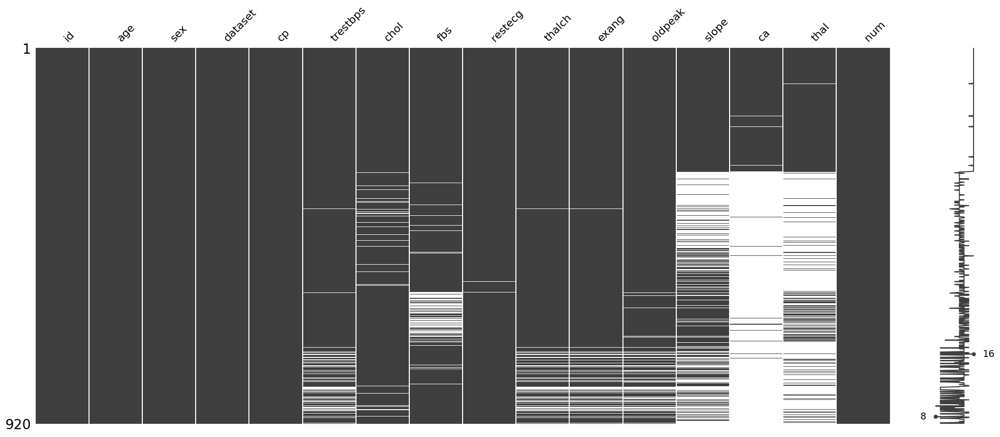

In [41]:
import missingno as mp
mp.matrix(df)

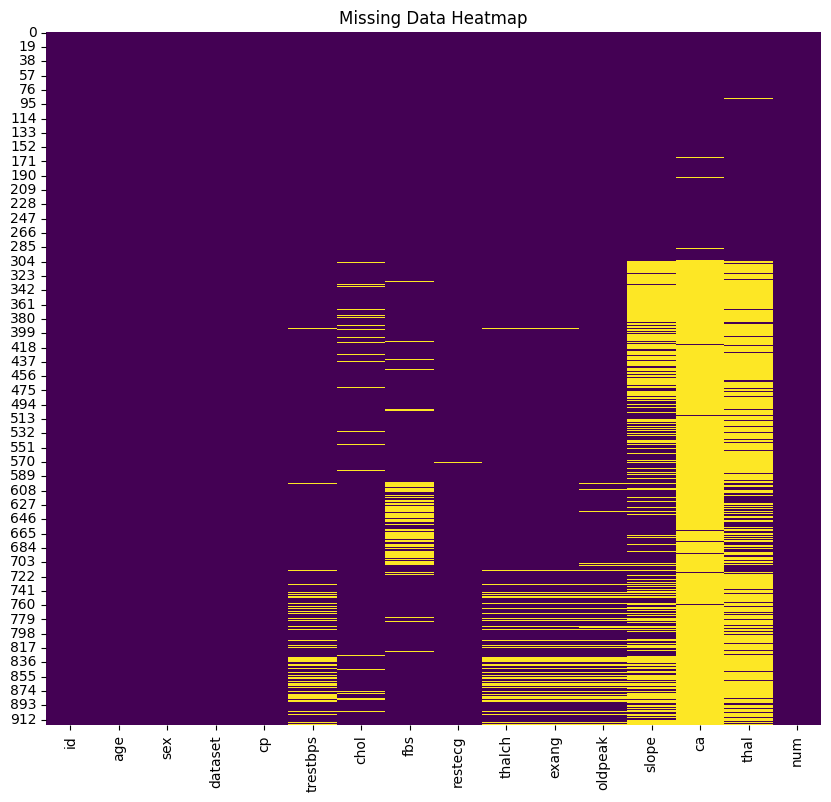

In [42]:
#same as above (showing missing values)

plt.figure(figsize=(10, 9))
sns.heatmap(df.isnull(), cbar=False, cmap='viridis')
plt.title("Missing Data Heatmap")
plt.show()

<Axes: >

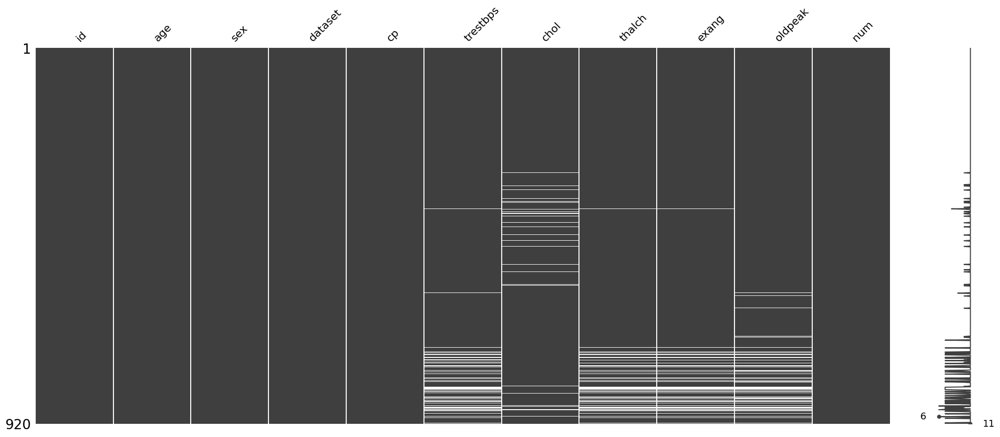

In [43]:
#droping  slope ,ca and thal

df.drop(['slope','ca','thal','fbs','restecg'], axis=1, inplace=True)
mp.matrix(df)

<Axes: >

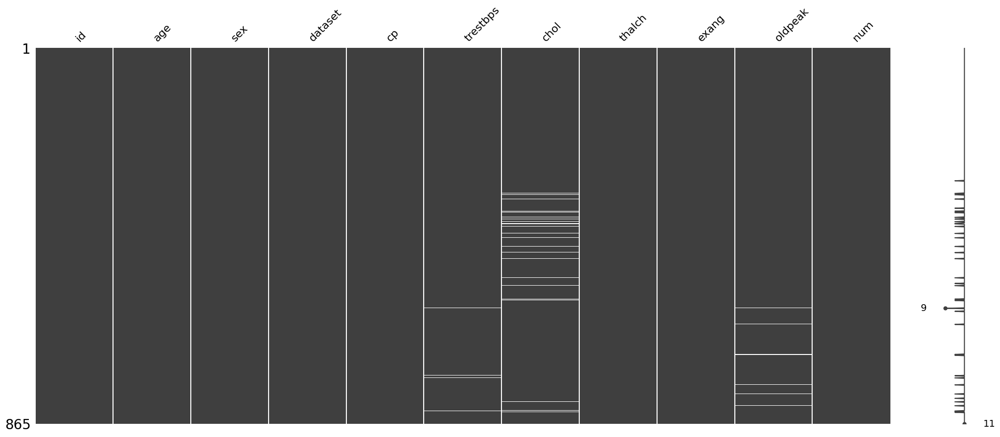

In [44]:
df.dropna(subset=['thalch'],inplace=True)
mp.matrix(df)

In [47]:
df['trestbps']=df['trestbps'].fillna(df['trestbps'].median())
df['chol']=df['chol'].fillna(df['chol'].median())
df['oldpeak']=df['oldpeak'].fillna(df['oldpeak'].median())

df.isnull().sum()

,0
id,0
age,0
sex,0
dataset,0
cp,0
trestbps,0
chol,0
thalch,0
exang,0
oldpeak,0


<Axes: >

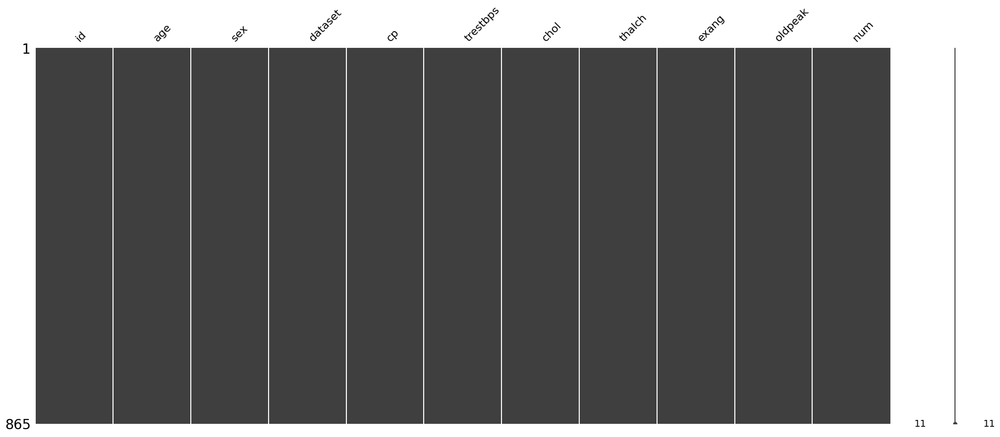

In [48]:
mp.matrix(df)

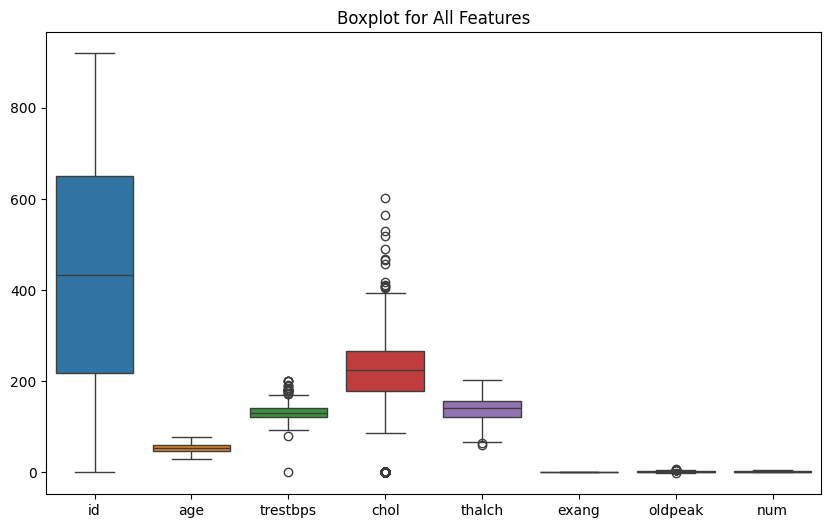

In [49]:
#boxplot
plt.figure(figsize=(10, 6))
sns.boxplot(data=df)
plt.title("Boxplot for All Features")
plt.show()

<Axes: xlabel='chol', ylabel='Count'>

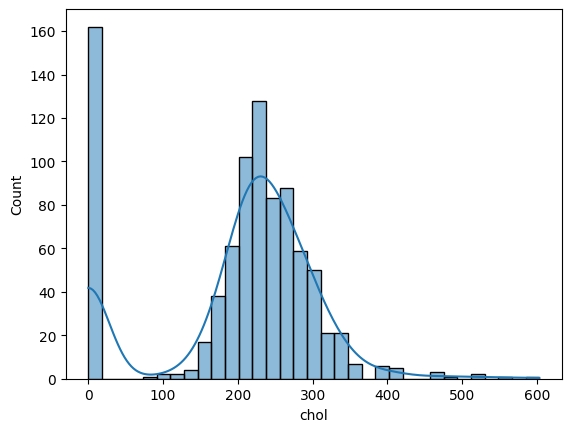

In [53]:
sns.histplot(df['chol'],kde= True)

In [57]:
from sklearn.preprocessing import RobustScaler
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler

<Axes: xlabel='chol_robust_scaled', ylabel='Count'>

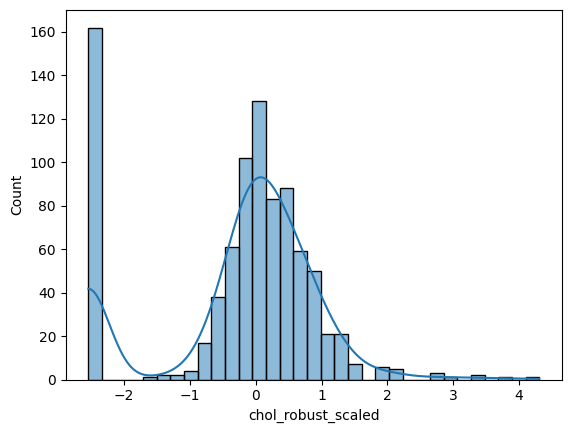

In [55]:
# Apply RobustScaler
scaler = RobustScaler()
df['chol_robust_scaled'] = scaler.fit_transform(df[['chol']])

sns.histplot(df['chol_robust_scaled'],kde=True)


<Axes: xlabel='chol_MinMax_scaled', ylabel='Count'>

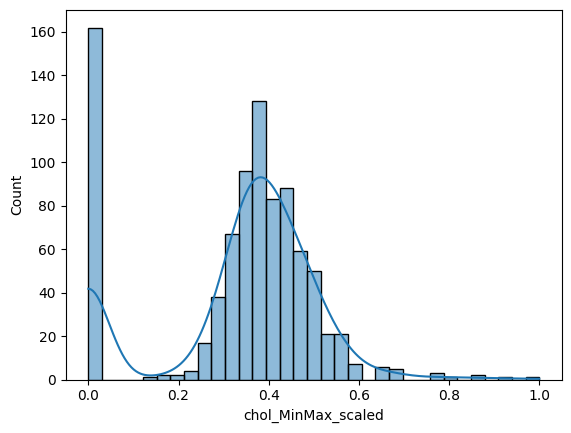

In [58]:
# Apply MinMaxScaler
scaler = MinMaxScaler()
df['chol_MinMax_scaled'] = scaler.fit_transform(df[['chol']])

sns.histplot(df['chol_MinMax_scaled'],kde=True)


<Axes: xlabel='chol_StandardScaler_scaled', ylabel='Count'>

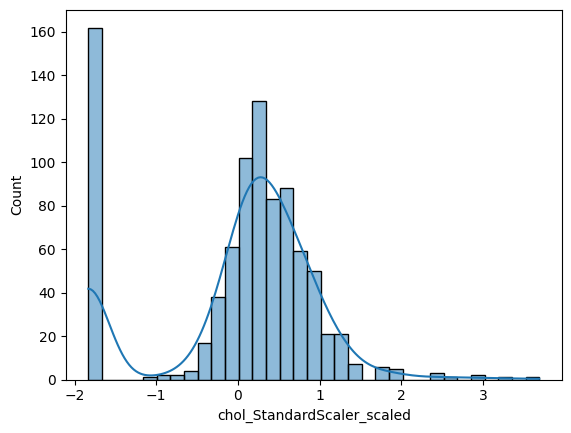

In [59]:
# Apply StandardScaler
scaler = StandardScaler()
df['chol_StandardScaler_scaled'] = scaler.fit_transform(df[['chol']])
sns.histplot(df['chol_StandardScaler_scaled'],kde=True)


<Axes: xlabel='chol_log_transformed', ylabel='Count'>

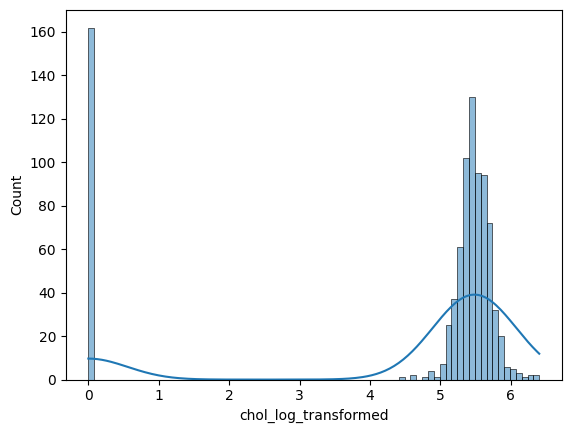

In [60]:
df['chol_log_transformed'] = np.log1p(df['chol'])
sns.histplot(df['chol_log_transformed'],kde=True)


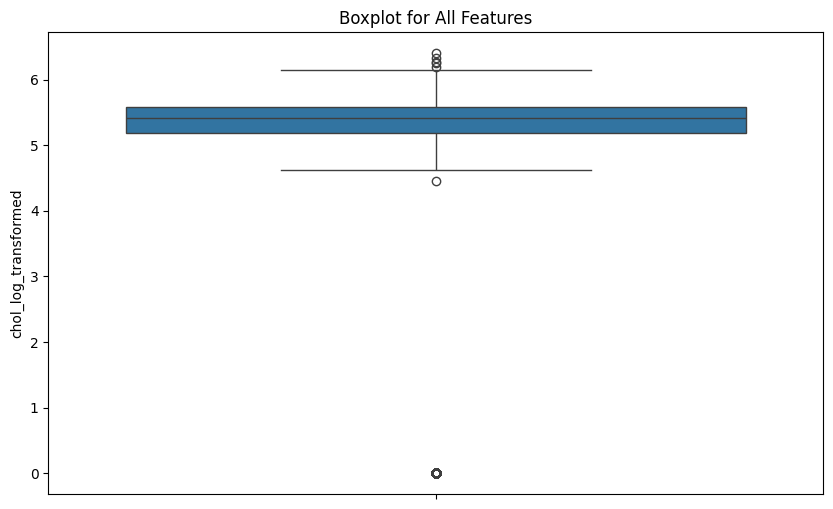

In [63]:
plt.figure(figsize=(10,6))
sns.boxplot(data=df['chol_log_transformed'])
plt.title("Boxplot for All Features")
plt.show()

In [64]:
!pip install ydata-profiling --q

  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 390.9/390.9 kB 6.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 296.5/296.5 kB 19.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 8.3/8.3 MB 49.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 687.8/687.8 kB 29.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 104.8/104.8 kB 7.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.5/4.5 MB 45.3 MB/s eta 0:00:00


In [65]:
from ydata_profiling import ProfileReport

report = ProfileReport(df)
report.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]